<a href="https://colab.research.google.com/github/anindita/dances/blob/main/application/apollo_experiment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Openpose

This has been modified by code written by [tugstugi](https://github.com/tugstugi/dl-colab-notebooks)


## Install OpenPose

In [ ]:
import os
from os.path import exists, join, basename, splitext

git_repo_url = 'https://github.com/CMU-Perceptual-Computing-Lab/openpose.git'
project_name = splitext(basename(git_repo_url))[0]
if not exists(project_name):
  # see: https://github.com/CMU-Perceptual-Computing-Lab/openpose/issues/949
  # install new CMake becaue of CUDA10
  !wget -q https://cmake.org/files/v3.13/cmake-3.13.0-Linux-x86_64.tar.gz
  !tar xfz cmake-3.13.0-Linux-x86_64.tar.gz --strip-components=1 -C /usr/local
  # clone openpose
  !git clone -q --depth 1 $git_repo_url
  !sed -i 's/execute_process(COMMAND git checkout master WORKING_DIRECTORY ${CMAKE_SOURCE_DIR}\/3rdparty\/caffe)/execute_process(COMMAND git checkout f019d0dfe86f49d1140961f8c7dec22130c83154 WORKING_DIRECTORY ${CMAKE_SOURCE_DIR}\/3rdparty\/caffe)/g' openpose/CMakeLists.txt
  # install system dependencies
  !apt-get -qq install -y libatlas-base-dev libprotobuf-dev libleveldb-dev libsnappy-dev libhdf5-serial-dev protobuf-compiler libgflags-dev libgoogle-glog-dev liblmdb-dev opencl-headers ocl-icd-opencl-dev libviennacl-dev
  # install python dependencies
  !pip install -q youtube-dl
  # build openpose
  !cd openpose && rm -rf build || true && mkdir build && cd build && cmake .. && make -j`nproc` && make pycaffe -j`nproc`
  
from IPython.display import YouTubeVideo

## Detect poses on video

We are going to detect poses on the following youtube video:

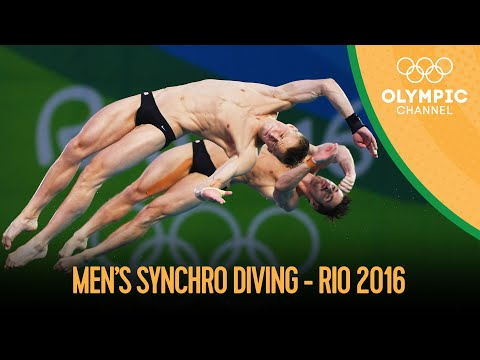

In [ ]:
YOUTUBE_ID = 'th79ucM5MA8'
YOUTUBE_ID_T = 'th79ucM5MA8'

YouTubeVideo(YOUTUBE_ID)

Download the above youtube video, cut the first 5 seconds and do the pose detection on that 5 seconds:

In [ ]:
!rm -rf youtube.mp4
# download the youtube with the given ID
!youtube-dl -f 'bestvideo[ext=mp4]' --output "youtube.%(ext)s" https://www.youtube.com/watch?v=$YOUTUBE_ID
# cut the first 5 seconds
!ffmpeg -y -loglevel info -i youtube.mp4 -ss 00:16:37 -t 10 video.mp4
#detect poses on the these 5 seconds
!rm -rf openpose/output
!rm openpose.avi
!cd openpose && ./build/examples/openpose/openpose.bin --video ../video.mp4 --write_json output --display 0 --number_people_max 1 --write_video ../base.avi
# convert the result into MP4
!ffmpeg -y -loglevel info -i base.avi output.mp4

[youtube] th79ucM5MA8: Downloading webpage
[download] Destination: youtube.mp4
[download] 100% of 1.69GiB in 01:32
ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis -

Finally, visualize the result:

In [ ]:
def show_local_mp4_video(file_name, width=640, height=480):
  import io
  import base64
  from IPython.display import HTML
  video_encoded = base64.b64encode(io.open(file_name, 'rb').read())
  return HTML(data='''<video width="{0}" height="{1}" alt="test" controls>
                        <source src="data:video/mp4;base64,{2}" type="video/mp4" />
                      </video>'''.format(width, height, video_encoded.decode('ascii')))

show_local_mp4_video('output.mp4', width=960, height=720)

# Detect and measure poses for entry

In [ ]:
!rm -rf youtube.mp4
# download the youtube with the given ID
!youtube-dl -f 'bestvideo[ext=mp4]' --output "youtube.%(ext)s" https://www.youtube.com/watch?v=$YOUTUBE_ID_T
# cut the first 5 seconds
!ffmpeg -y -loglevel info -i youtube.mp4 -ss 00:09:13 -t 5 video.mp4
#detect poses on the these 5 seconds
!rm -rf openpose/output
!rm openpose.avi
!cd openpose && ./build/examples/openpose/openpose.bin --video ../video.mp4 --write_json output_t --display 0 --write_video ../base.avi
# convert the result into MP4
!ffmpeg -y -loglevel info -i base.avi test.mp4

[youtube] th79ucM5MA8: Downloading webpage
[download] Destination: youtube.mp4
[download] 100% of 1.69GiB in 01:47
ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis -

In [ ]:
show_local_mp4_video('test.mp4', width=960, height=720)

In [ ]:
def compare_poses(dir, pt=8):
  import json
  import glob
  pose = []
  
  for filename in glob.glob(os.path.join(dir, '*.json')): #only process .JSON files in folder.      
      with open(filename, encoding='utf-8', mode='r') as currentFile:
          data=currentFile.read().replace('\n', '')
          keyword = json.loads(data)["people"]
          if keyword not in pose:
              pose.append(keyword)
  print(pose[0][0]['pose_keypoints_2d'])
  pose = pose[0][0]['pose_keypoints_2d']

import shutil
shutil.make_archive('openpose/so_what_base', 'zip', 'openpose/so_what_base')
shutil.make_archive('openpose/output_t', 'zip', 'openpose/output_t')
  

In [ ]:
import json # handle json files
import math
import numpy as np


def get_positions_lists(directory):
    json_folder_path = os.path.join(directory)
    json_files = [ x for x in os.listdir(json_folder_path) if x.endswith("json") ]
    result = []
    for json_file in json_files:
        json_file_path = os.path.join(json_folder_path, json_file)
        with open (json_file_path, "r") as f:
            data = json.load(f)
            try:
                result.append(data["people"][0]["pose_keypoints_2d"])
            except:
                result.append([])
    return result

# Step 1: Gather all positions per frame for entry
og = get_positions_lists('openpose/so_what_base')
en = get_positions_lists('openpose/output_t')

def running_averages(scores):
    running_averages = [100]
    for frame, score in enumerate(scores):
        prev_avg = running_averages[-1]
        if score < 0:
            running_averages.append(prev_avg)
        else:
            add = min(100, score)
            running_averages.append((prev_avg * frame + add) / (frame + 1))
    return running_averages

def oks_score(og, en):
    score = []
    
    for i in range(0,len(og)):
        og_frame = og[i]
        try:
            en_frame = en[i]
        except IndexError:
            break

        if not og_frame or not en_frame:
            score.append(-1)
            continue
    
        frame_score = 0
        points = 25
        height = 1280*720 * 4
        k = 0.72

        for p in range(0, points * 3, 3):
            if en_frame[p+2] == 0.0 or og_frame[p+2] == 0.0:
                points -= 1
                continue
            distance = math.sqrt((en_frame[p] - og_frame[p]) ** 2 + (en_frame[p + 1] - og_frame[p + 1]) ** 2)
            frame_score += math.exp(-((distance ** 2)/(2 * height / (en_frame[p+2] * og_frame[p+2]) * k ** 2)))
        
        score.append(100 * (frame_score ** 1.2) / points)

    return running_averages(score)

print(f"Your score is {oks_score(og,en)[-1]} !")
print(len(og))
print(len(en))

In [ ]:
import os # for manipulates files and subdirectories
import json # handle json files
import math
import matplotlib.pyplot as plt
import numpy as np

def get_positions_lists(directory, offset=0, transition=0):
    json_folder_path = os.path.join(directory)
    json_files = [ x for x in os.listdir(json_folder_path) if x.endswith("json") ]
    result = []

    for i in range(offset*30,len(json_files)):
        json_file = json_files[i]
        json_file_path = os.path.join(json_folder_path, json_file)
        with open (json_file_path, "r") as f:
            data = json.load(f)
            try:
                result.append(data["people"][0]["pose_keypoints_2d"])
            except:
                result.append([])
    return result

def translate(lists):
    for l in lists:
        if not l:
            continue
        x = l[8*3]
        y = l[8*3 + 1]
        for i in range(0,len(l),3):
            if l[i+2] == 0:
                l[i] = 0
                l[i+1] = 0
            else:
                l[i] -= x
                l[i+1] -= y

def translate_frame(frame, x, y):
    for i in range(0,len(frame),3):
        frame[i] -= x
        frame[i+1] -= y

def get_gradient_diff(f1, f2, a, b, frame_score):
    x_1a = f1[a*3]
    y_1a = f1[a*3 + 1]
    x_1b = f1[b*3]
    y_1b = f1[b*3 + 1]

    x_2a = f2[a*3]
    y_2a = f2[a*3 + 1]
    x_2b = f2[b*3]
    y_2b = f2[b*3 + 1]

    try:
        grad1 = (y_1b - y_1a) / (x_1b - x_1a)
        grad2 = (y_2b - y_2a) / (x_2b - x_2a)
        diff = abs(grad1 - grad2)
    except ZeroDivisionError:
        diff = 11

    angle = get_angle_diff(f1,f2,a,b)
    
    if diff < 1 and angle < 5:
        return frame_score * 2
    elif diff < 10 or angle < 10:
        return frame_score * 0.91
    else:
        return frame_score / 10

def get_angle_diff(f1, f2, a, b):
    x_1a = f1[a*3]
    y_1a = f1[a*3 + 1]
    x_1b = f1[b*3]
    y_1b = f1[b*3 + 1]

    x_2a = f2[a*3]
    y_2a = f2[a*3 + 1]

    angle1 = math.atan2(y_1a - y_1b, x_1a - x_1b)
    angle2 = math.atan2(y_2a - y_1b, x_2a - x_1b)

    angle_between = np.mod((angle1 - angle2) * (180 / math.pi), 180)

    return min(angle_between, abs(180-angle_between))/180

def angle_score(og, en):
    score = 0
    f_score = 500 / len(en)

    for i in range(0,len(og)):
        og_frame = og[i]
        try:
            en_frame = en[i]
        except IndexError:
            break

        if not og_frame or not en_frame:
            continue

        frame_score = 1
        frame_score = get_gradient_diff(og_frame, en_frame, 0, 1, frame_score)
        frame_score = get_gradient_diff(og_frame, en_frame, 1, 2, frame_score)
        frame_score = get_gradient_diff(og_frame, en_frame, 1, 5, frame_score)
        frame_score = get_gradient_diff(og_frame, en_frame, 1, 8, frame_score)
        frame_score = get_gradient_diff(og_frame, en_frame, 2, 3, frame_score)
        frame_score = get_gradient_diff(og_frame, en_frame, 3, 4, frame_score)
        frame_score = get_gradient_diff(og_frame, en_frame, 5, 6, frame_score)
        frame_score = get_gradient_diff(og_frame, en_frame, 6, 7, frame_score)
        frame_score = get_gradient_diff(og_frame, en_frame, 8, 9, frame_score)
        frame_score = get_gradient_diff(og_frame, en_frame, 8, 12, frame_score)
        frame_score = get_gradient_diff(og_frame, en_frame, 9, 10, frame_score)
        frame_score = get_gradient_diff(og_frame, en_frame, 10, 11, frame_score)
        frame_score = get_gradient_diff(og_frame, en_frame, 12, 13, frame_score)
        frame_score = get_gradient_diff(og_frame, en_frame, 13, 14, frame_score)

        score += f_score * frame_score / 32

    return score

def position_score(og, en):
    score = 0
    f_score = 500 / len(en)

    translate(og)
    translate(en)
    
    for i in range(0,len(og)):
        og_frame = og[i]
        try:
            en_frame = en[i]
        except IndexError:
            break

        if not og_frame or not en_frame:
            continue

        og_torso = math.sqrt((og_frame[1*3] - og_frame[1*8]) ** 2 + (og_frame[1*3 + 1] - og_frame[1*8 + 1]) ** 2)
        en_torso = math.sqrt((en_frame[1*3] - en_frame[1*8]) ** 2 + (en_frame[1*3 + 1] - en_frame[1*8 + 1]) ** 2)

        scale_factor = og_torso / en_torso

        for p in range(0, len(en_frame), 3):
            en[i][p] *= scale_factor
            en[i][p+1] *= scale_factor

        frame_score = 1

        for p in range(0, 15*3, 3):
            distance = math.sqrt((en_frame[p] - og_frame[p]) ** 2 + (en_frame[p + 1] - og_frame[p + 1]) ** 2)
            if distance < 10:
                frame_score *= 2
            elif distance < 60:
                frame_score += 1
            elif distance > 300:
                frame_score /= 2

        score += f_score * frame_score / 15

    return int(score)

def running_averages(scores, split=0):
    running_averages = [100]
    skip_frames = []
    if split > 0:
        midpoint = split * 30
        begin = midpoint - 45
        end = midpoint + 45
        skip_frames = range(begin,end)

    for frame, score in enumerate(scores):
        prev_avg = running_averages[-1]
        if score < 0 or frame in skip_frames:
            running_averages.append(prev_avg)
        else:
            add = min(100, score)
            running_averages.append((prev_avg * frame + add) / (frame + 1))
    return running_averages

def minmax(val_list):
    min_val = min(val_list)
    max_val = max(val_list)

    return (min_val, max_val)

def oks_score(og, en, res=1, split=0):
    score = []

    translate(og)
    translate(en)
    
    for i in range(0,len(og)):
        og_frame = og[i]
        try:
            en_frame = en[i]
        except IndexError:
            break

        if not og_frame or not en_frame:
            continue

        point_1 = 0
        point_2 = 8

        og_torso = math.sqrt((og_frame[1*point_1] - og_frame[1*point_2]) ** 2 + (og_frame[1*point_1 + 1] - og_frame[1*point_2 + 1]) ** 2)
        en_torso = math.sqrt((en_frame[1*point_1] - en_frame[1*point_2]) ** 2 + (en_frame[1*point_1 + 1] - en_frame[1*point_2 + 1]) ** 2)

        try:
            scale_factor = og_torso / en_torso
        except ZeroDivisionError:
            scale_factor = 1

        for p in range(0, len(en_frame), 3):
            en[i][p] *= scale_factor
            en[i][p+1] *= scale_factor
    
    for i in range(0,len(og)):
        og_frame = og[i]
        try:
            en_frame = en[i]
        except IndexError:
            break

        if not og_frame or not en_frame:
            score.append(-1)
            continue
    
        frame_score = 0
        points = 15

        min_x, max_x = minmax(en_frame[0::3])
        min_y, max_y = minmax(en_frame[1::3])
        # Fixed 23/01 19:05
        height = (max_x - min_x) * (max_y - min_y)
        height = max(height, 0.5) * res
        k = 0.0005

        for p in range(0, points * 3, 3):
            if en_frame[p+2] == 0.0 or og_frame[p+2] == 0.0:
                points -= 1
                continue
            distance = math.sqrt((en_frame[p] - og_frame[p]) ** 2 + (en_frame[p + 1] - og_frame[p + 1]) ** 2)
            frame_score += math.exp(-((distance ** 2)/(2 * height ** 2 * k ** 2)))
        
        score.append(100 * (frame_score ** 1.2) / points)

    return running_averages(score, split)

numbers = [1, 2, -3, 7, 1]

# Step 0: Gather all positions per frame for entry
# bh = get_positions_lists('train/bh')
# bh_t = get_positions_lists('train/bh_t')
# nbtm = get_positions_lists('train/nbtm')
# nbtm_t = get_positions_lists('train/nbtm_t')
# green = get_positions_lists('train/green')
# green2 = get_positions_lists('train/green2')


# print(f"Blue Hour OKS score is {oks_score(bh,bh_t)[-1]}")
# print(f"By the Moon OKS score is {oks_score(nbtm,nbtm_t)[-1]}")

# print(f"So What OKS score is {oks_score(sw,sw_n)[-1]}")

# print(f"Blue Hour score is {angle_score(og,en) + position_score(og,en)}")
# print(f"By the Moon score is {angle_score(out,outt) + position_score(out,outt)}")


# # Print frame on graph
# plt.xlabel("X-axis")
# plt.ylabel("Y-axis")
# plt.title("A test graph")
# fig = plt.figure(1)
# fig.add_subplot()
# for i in range(0,len(og[5]),3):
#     plt.scatter(og[5][i], og[5][i+1], color='red')

# fig.add_subplot()
# for i in range(0,len(en[0]),3):
#     plt.scatter(en[5][i], en[5][i+1], color='blue')

# plt.tight_layout()
# plt.show()